In [1]:
%matplotlib inline

In [2]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed = 10

print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  10


In [3]:
# Root directory for dataset
dataroot = "pokemon/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 32

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 200

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

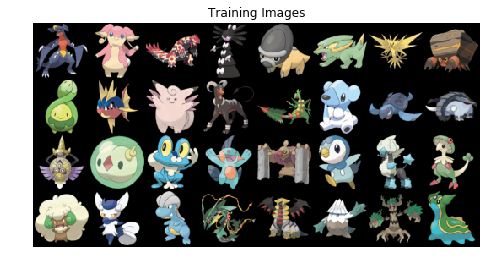

In [4]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [5]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [6]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [7]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [8]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [9]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [10]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [11]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 1 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/200][0/26]	Loss_D: 2.1617	Loss_G: 5.7263	D(x): 0.5212	D(G(z)): 0.6711 / 0.0051
[0/200][1/26]	Loss_D: 0.6821	Loss_G: 6.9672	D(x): 0.9193	D(G(z)): 0.3910 / 0.0012
[0/200][2/26]	Loss_D: 0.1613	Loss_G: 6.0833	D(x): 0.9273	D(G(z)): 0.0734 / 0.0030
[0/200][3/26]	Loss_D: 0.2519	Loss_G: 5.7829	D(x): 0.9347	D(G(z)): 0.1475 / 0.0038
[0/200][4/26]	Loss_D: 0.1993	Loss_G: 5.9985	D(x): 0.9612	D(G(z)): 0.1307 / 0.0028
[0/200][5/26]	Loss_D: 0.3112	Loss_G: 7.2807	D(x): 0.9566	D(G(z)): 0.2106 / 0.0008
[0/200][6/26]	Loss_D: 0.1651	Loss_G: 7.3902	D(x): 0.9560	D(G(z)): 0.1062 / 0.0008
[0/200][7/26]	Loss_D: 0.4292	Loss_G: 5.7189	D(x): 0.8568	D(G(z)): 0.0538 / 0.0047
[0/200][8/26]	Loss_D: 0.6948	Loss_G: 10.1799	D(x): 0.9418	D(G(z)): 0.4036 / 0.0001
[0/200][9/26]	Loss_D: 0.0877	Loss_G: 9.0073	D(x): 0.9408	D(G(z)): 0.0085 / 0.0002
[0/200][10/26]	Loss_D: 0.1214	Loss_G: 5.8835	D(x): 0.9232	D(G(z)): 0.0231 / 0.0036
[0/200][11/26]	Loss_D: 0.5293	Loss_G: 11.1958	D(x): 0.9619	D(G(z)): 0.

[3/200][21/26]	Loss_D: 0.7745	Loss_G: 2.7332	D(x): 0.5815	D(G(z)): 0.1122 / 0.1038
[3/200][22/26]	Loss_D: 0.9903	Loss_G: 6.0132	D(x): 0.8758	D(G(z)): 0.5127 / 0.0065
[3/200][23/26]	Loss_D: 0.7861	Loss_G: 3.3915	D(x): 0.5796	D(G(z)): 0.0669 / 0.0574
[3/200][24/26]	Loss_D: 0.6791	Loss_G: 5.5224	D(x): 0.9318	D(G(z)): 0.4161 / 0.0049
[3/200][25/26]	Loss_D: 0.8340	Loss_G: 3.1254	D(x): 0.6176	D(G(z)): 0.0883 / 0.0562
[4/200][0/26]	Loss_D: 0.9676	Loss_G: 5.4544	D(x): 0.8091	D(G(z)): 0.4586 / 0.0066
[4/200][1/26]	Loss_D: 0.8091	Loss_G: 3.6201	D(x): 0.6354	D(G(z)): 0.1290 / 0.0411
[4/200][2/26]	Loss_D: 0.6121	Loss_G: 5.4562	D(x): 0.8614	D(G(z)): 0.3275 / 0.0070
[4/200][3/26]	Loss_D: 0.6460	Loss_G: 3.0238	D(x): 0.6502	D(G(z)): 0.1260 / 0.0739
[4/200][4/26]	Loss_D: 1.1204	Loss_G: 7.4561	D(x): 0.7992	D(G(z)): 0.4924 / 0.0012
[4/200][5/26]	Loss_D: 1.1368	Loss_G: 2.7863	D(x): 0.4083	D(G(z)): 0.0147 / 0.1243
[4/200][6/26]	Loss_D: 1.3667	Loss_G: 7.8483	D(x): 0.9400	D(G(z)): 0.6126 / 0.0009
[4/200][7/2

[7/200][22/26]	Loss_D: 0.1763	Loss_G: 5.9746	D(x): 0.8609	D(G(z)): 0.0162 / 0.0043
[7/200][23/26]	Loss_D: 0.1690	Loss_G: 4.2487	D(x): 0.9101	D(G(z)): 0.0540 / 0.0198
[7/200][24/26]	Loss_D: 0.2171	Loss_G: 6.0940	D(x): 0.9580	D(G(z)): 0.1539 / 0.0027
[7/200][25/26]	Loss_D: 0.0957	Loss_G: 6.0204	D(x): 0.9447	D(G(z)): 0.0333 / 0.0031
[8/200][0/26]	Loss_D: 0.0998	Loss_G: 5.5307	D(x): 0.9647	D(G(z)): 0.0597 / 0.0053
[8/200][1/26]	Loss_D: 0.3313	Loss_G: 3.0333	D(x): 0.8007	D(G(z)): 0.0706 / 0.0572
[8/200][2/26]	Loss_D: 1.1078	Loss_G: 17.6807	D(x): 0.9715	D(G(z)): 0.6336 / 0.0000
[8/200][3/26]	Loss_D: 6.0184	Loss_G: 8.3204	D(x): 0.0053	D(G(z)): 0.0000 / 0.0008
[8/200][4/26]	Loss_D: 0.1125	Loss_G: 3.0339	D(x): 0.9182	D(G(z)): 0.0153 / 0.1484
[8/200][5/26]	Loss_D: 1.1238	Loss_G: 9.8204	D(x): 0.9927	D(G(z)): 0.5489 / 0.0001
[8/200][6/26]	Loss_D: 0.8180	Loss_G: 5.5993	D(x): 0.5262	D(G(z)): 0.0027 / 0.0072
[8/200][7/26]	Loss_D: 0.3330	Loss_G: 4.3855	D(x): 0.9462	D(G(z)): 0.1880 / 0.0250
[8/200][8/2

[11/200][20/26]	Loss_D: 0.5647	Loss_G: 6.2848	D(x): 0.9263	D(G(z)): 0.3555 / 0.0029
[11/200][21/26]	Loss_D: 0.9555	Loss_G: 1.8395	D(x): 0.4714	D(G(z)): 0.0072 / 0.2490
[11/200][22/26]	Loss_D: 0.9043	Loss_G: 5.9126	D(x): 0.9702	D(G(z)): 0.5324 / 0.0050
[11/200][23/26]	Loss_D: 0.6240	Loss_G: 4.0719	D(x): 0.6110	D(G(z)): 0.0126 / 0.0330
[11/200][24/26]	Loss_D: 0.3425	Loss_G: 2.3525	D(x): 0.8540	D(G(z)): 0.1199 / 0.1293
[11/200][25/26]	Loss_D: 0.8671	Loss_G: 6.8181	D(x): 0.9799	D(G(z)): 0.4953 / 0.0016
[12/200][0/26]	Loss_D: 0.7314	Loss_G: 3.3091	D(x): 0.5604	D(G(z)): 0.0211 / 0.0597
[12/200][1/26]	Loss_D: 0.2525	Loss_G: 2.8294	D(x): 0.9134	D(G(z)): 0.1358 / 0.0783
[12/200][2/26]	Loss_D: 0.6271	Loss_G: 6.5773	D(x): 0.9228	D(G(z)): 0.3894 / 0.0028
[12/200][3/26]	Loss_D: 0.5856	Loss_G: 3.6159	D(x): 0.6292	D(G(z)): 0.0195 / 0.0402
[12/200][4/26]	Loss_D: 0.2533	Loss_G: 2.2705	D(x): 0.8685	D(G(z)): 0.0959 / 0.1304
[12/200][5/26]	Loss_D: 0.9328	Loss_G: 8.7901	D(x): 0.9716	D(G(z)): 0.5600 / 0.000

[15/200][17/26]	Loss_D: 0.3911	Loss_G: 7.7787	D(x): 0.9810	D(G(z)): 0.2559 / 0.0015
[15/200][18/26]	Loss_D: 0.7195	Loss_G: 1.9338	D(x): 0.5958	D(G(z)): 0.0151 / 0.2703
[15/200][19/26]	Loss_D: 1.1933	Loss_G: 7.9934	D(x): 0.9625	D(G(z)): 0.6056 / 0.0007
[15/200][20/26]	Loss_D: 1.0126	Loss_G: 3.1061	D(x): 0.4557	D(G(z)): 0.0091 / 0.1258
[15/200][21/26]	Loss_D: 0.8635	Loss_G: 7.4573	D(x): 0.9894	D(G(z)): 0.4738 / 0.0013
[15/200][22/26]	Loss_D: 0.3740	Loss_G: 4.7230	D(x): 0.7390	D(G(z)): 0.0146 / 0.0174
[15/200][23/26]	Loss_D: 0.2738	Loss_G: 4.4051	D(x): 0.9594	D(G(z)): 0.1811 / 0.0207
[15/200][24/26]	Loss_D: 0.4598	Loss_G: 3.4935	D(x): 0.8017	D(G(z)): 0.1444 / 0.0541
[15/200][25/26]	Loss_D: 0.5260	Loss_G: 4.1193	D(x): 0.8021	D(G(z)): 0.2123 / 0.0240
[16/200][0/26]	Loss_D: 0.5415	Loss_G: 7.5172	D(x): 0.9190	D(G(z)): 0.3073 / 0.0009
[16/200][1/26]	Loss_D: 1.2994	Loss_G: 0.7367	D(x): 0.3573	D(G(z)): 0.0075 / 0.5466
[16/200][2/26]	Loss_D: 2.1261	Loss_G: 11.3164	D(x): 0.9975	D(G(z)): 0.8307 / 0

[19/200][14/26]	Loss_D: 1.8424	Loss_G: 7.9499	D(x): 0.9879	D(G(z)): 0.7854 / 0.0015
[19/200][15/26]	Loss_D: 1.0860	Loss_G: 3.9894	D(x): 0.4092	D(G(z)): 0.0130 / 0.0476
[19/200][16/26]	Loss_D: 0.3285	Loss_G: 3.0922	D(x): 0.8837	D(G(z)): 0.1436 / 0.1093
[19/200][17/26]	Loss_D: 1.0721	Loss_G: 7.1031	D(x): 0.9556	D(G(z)): 0.5526 / 0.0019
[19/200][18/26]	Loss_D: 0.6687	Loss_G: 4.5505	D(x): 0.5906	D(G(z)): 0.0148 / 0.0233
[19/200][19/26]	Loss_D: 0.2990	Loss_G: 3.2840	D(x): 0.9085	D(G(z)): 0.1516 / 0.0636
[19/200][20/26]	Loss_D: 0.4114	Loss_G: 3.7813	D(x): 0.8732	D(G(z)): 0.2134 / 0.0392
[19/200][21/26]	Loss_D: 0.1997	Loss_G: 3.9599	D(x): 0.9126	D(G(z)): 0.0968 / 0.0282
[19/200][22/26]	Loss_D: 0.3065	Loss_G: 3.6994	D(x): 0.8728	D(G(z)): 0.1416 / 0.0389
[19/200][23/26]	Loss_D: 0.2173	Loss_G: 3.9135	D(x): 0.9076	D(G(z)): 0.1022 / 0.0291
[19/200][24/26]	Loss_D: 0.4376	Loss_G: 2.0683	D(x): 0.7415	D(G(z)): 0.0810 / 0.1620
[19/200][25/26]	Loss_D: 0.5518	Loss_G: 6.1259	D(x): 0.9377	D(G(z)): 0.3558 /

[23/200][10/26]	Loss_D: 0.4727	Loss_G: 2.4867	D(x): 0.7000	D(G(z)): 0.0510 / 0.1372
[23/200][11/26]	Loss_D: 0.5959	Loss_G: 5.2433	D(x): 0.9807	D(G(z)): 0.3937 / 0.0093
[23/200][12/26]	Loss_D: 0.3577	Loss_G: 4.3409	D(x): 0.7909	D(G(z)): 0.0823 / 0.0264
[23/200][13/26]	Loss_D: 0.3220	Loss_G: 2.8879	D(x): 0.8172	D(G(z)): 0.0972 / 0.0870
[23/200][14/26]	Loss_D: 0.8152	Loss_G: 5.4077	D(x): 0.8981	D(G(z)): 0.4520 / 0.0071
[23/200][15/26]	Loss_D: 0.9138	Loss_G: 1.9818	D(x): 0.5134	D(G(z)): 0.0569 / 0.1861
[23/200][16/26]	Loss_D: 0.7353	Loss_G: 3.5672	D(x): 0.8688	D(G(z)): 0.3367 / 0.0541
[23/200][17/26]	Loss_D: 0.7064	Loss_G: 4.7040	D(x): 0.7575	D(G(z)): 0.2821 / 0.0141
[23/200][18/26]	Loss_D: 0.3387	Loss_G: 3.4913	D(x): 0.7780	D(G(z)): 0.0452 / 0.0566
[23/200][19/26]	Loss_D: 0.3020	Loss_G: 3.7993	D(x): 0.9357	D(G(z)): 0.1905 / 0.0348
[23/200][20/26]	Loss_D: 0.2893	Loss_G: 4.3901	D(x): 0.9190	D(G(z)): 0.1636 / 0.0172
[23/200][21/26]	Loss_D: 0.3415	Loss_G: 3.1908	D(x): 0.8085	D(G(z)): 0.0788 /

[27/200][5/26]	Loss_D: 1.2231	Loss_G: 4.7252	D(x): 0.3831	D(G(z)): 0.0017 / 0.0214
[27/200][6/26]	Loss_D: 0.1392	Loss_G: 3.0110	D(x): 0.9689	D(G(z)): 0.0888 / 0.0878
[27/200][7/26]	Loss_D: 0.5930	Loss_G: 6.9221	D(x): 0.9857	D(G(z)): 0.3670 / 0.0020
[27/200][8/26]	Loss_D: 0.2159	Loss_G: 5.3047	D(x): 0.8429	D(G(z)): 0.0241 / 0.0091
[27/200][9/26]	Loss_D: 0.3185	Loss_G: 2.4650	D(x): 0.8165	D(G(z)): 0.0814 / 0.1229
[27/200][10/26]	Loss_D: 0.7273	Loss_G: 5.3958	D(x): 0.8365	D(G(z)): 0.3839 / 0.0085
[27/200][11/26]	Loss_D: 0.8092	Loss_G: 1.2249	D(x): 0.5710	D(G(z)): 0.0685 / 0.3473
[27/200][12/26]	Loss_D: 0.9490	Loss_G: 7.8146	D(x): 0.9453	D(G(z)): 0.5124 / 0.0007
[27/200][13/26]	Loss_D: 0.7622	Loss_G: 3.0887	D(x): 0.5376	D(G(z)): 0.0113 / 0.0883
[27/200][14/26]	Loss_D: 0.3338	Loss_G: 3.9260	D(x): 0.9542	D(G(z)): 0.2153 / 0.0291
[27/200][15/26]	Loss_D: 0.3132	Loss_G: 5.4326	D(x): 0.9359	D(G(z)): 0.1880 / 0.0072
[27/200][16/26]	Loss_D: 0.4986	Loss_G: 2.4902	D(x): 0.6619	D(G(z)): 0.0325 / 0.13

[31/200][0/26]	Loss_D: 0.1427	Loss_G: 4.2241	D(x): 0.8860	D(G(z)): 0.0148 / 0.0247
[31/200][1/26]	Loss_D: 0.3371	Loss_G: 4.3376	D(x): 0.9162	D(G(z)): 0.1884 / 0.0202
[31/200][2/26]	Loss_D: 0.3807	Loss_G: 3.9654	D(x): 0.8320	D(G(z)): 0.1482 / 0.0316
[31/200][3/26]	Loss_D: 0.5693	Loss_G: 5.3835	D(x): 0.8786	D(G(z)): 0.2711 / 0.0077
[31/200][4/26]	Loss_D: 0.6279	Loss_G: 2.0221	D(x): 0.6297	D(G(z)): 0.0569 / 0.1680
[31/200][5/26]	Loss_D: 0.7944	Loss_G: 8.0509	D(x): 0.9587	D(G(z)): 0.4711 / 0.0009
[31/200][6/26]	Loss_D: 0.8827	Loss_G: 3.5442	D(x): 0.4920	D(G(z)): 0.0274 / 0.0582
[31/200][7/26]	Loss_D: 0.4750	Loss_G: 5.0038	D(x): 0.9764	D(G(z)): 0.3061 / 0.0116
[31/200][8/26]	Loss_D: 0.3820	Loss_G: 5.2660	D(x): 0.8878	D(G(z)): 0.1796 / 0.0084
[31/200][9/26]	Loss_D: 0.2668	Loss_G: 4.0805	D(x): 0.8493	D(G(z)): 0.0723 / 0.0277
[31/200][10/26]	Loss_D: 0.3159	Loss_G: 4.6073	D(x): 0.9167	D(G(z)): 0.1882 / 0.0148
[31/200][11/26]	Loss_D: 0.4134	Loss_G: 3.3422	D(x): 0.7678	D(G(z)): 0.0948 / 0.0544
[3

[34/200][24/26]	Loss_D: 0.3027	Loss_G: 4.2323	D(x): 0.8354	D(G(z)): 0.0787 / 0.0253
[34/200][25/26]	Loss_D: 0.6073	Loss_G: 1.6538	D(x): 0.6855	D(G(z)): 0.0912 / 0.2457
[35/200][0/26]	Loss_D: 0.9092	Loss_G: 7.2806	D(x): 0.9754	D(G(z)): 0.5375 / 0.0010
[35/200][1/26]	Loss_D: 0.9485	Loss_G: 2.7920	D(x): 0.4750	D(G(z)): 0.0107 / 0.1001
[35/200][2/26]	Loss_D: 0.5043	Loss_G: 4.2056	D(x): 0.9661	D(G(z)): 0.3216 / 0.0213
[35/200][3/26]	Loss_D: 0.2616	Loss_G: 4.2076	D(x): 0.8733	D(G(z)): 0.0975 / 0.0226
[35/200][4/26]	Loss_D: 0.3919	Loss_G: 3.4933	D(x): 0.8338	D(G(z)): 0.1423 / 0.0496
[35/200][5/26]	Loss_D: 0.3045	Loss_G: 3.1249	D(x): 0.8291	D(G(z)): 0.0921 / 0.0754
[35/200][6/26]	Loss_D: 0.6075	Loss_G: 4.2345	D(x): 0.8208	D(G(z)): 0.2899 / 0.0210
[35/200][7/26]	Loss_D: 0.3801	Loss_G: 2.9150	D(x): 0.7522	D(G(z)): 0.0618 / 0.0866
[35/200][8/26]	Loss_D: 0.3386	Loss_G: 3.0922	D(x): 0.8781	D(G(z)): 0.1657 / 0.0639
[35/200][9/26]	Loss_D: 0.3268	Loss_G: 3.5040	D(x): 0.8832	D(G(z)): 0.1578 / 0.0416
[3

[38/200][21/26]	Loss_D: 0.3550	Loss_G: 3.4277	D(x): 0.7588	D(G(z)): 0.0541 / 0.0510
[38/200][22/26]	Loss_D: 0.2887	Loss_G: 3.1511	D(x): 0.8758	D(G(z)): 0.1266 / 0.0603
[38/200][23/26]	Loss_D: 0.5729	Loss_G: 6.4647	D(x): 0.9405	D(G(z)): 0.3650 / 0.0022
[38/200][24/26]	Loss_D: 0.8968	Loss_G: 1.4127	D(x): 0.4726	D(G(z)): 0.0101 / 0.3012
[38/200][25/26]	Loss_D: 0.7447	Loss_G: 6.4001	D(x): 0.9888	D(G(z)): 0.4262 / 0.0028
[39/200][0/26]	Loss_D: 0.2618	Loss_G: 4.6565	D(x): 0.8376	D(G(z)): 0.0538 / 0.0204
[39/200][1/26]	Loss_D: 0.2033	Loss_G: 3.7118	D(x): 0.8856	D(G(z)): 0.0646 / 0.0518
[39/200][2/26]	Loss_D: 0.3047	Loss_G: 3.8695	D(x): 0.9067	D(G(z)): 0.1609 / 0.0315
[39/200][3/26]	Loss_D: 0.3918	Loss_G: 4.0580	D(x): 0.8485	D(G(z)): 0.1663 / 0.0273
[39/200][4/26]	Loss_D: 0.4365	Loss_G: 2.4495	D(x): 0.7692	D(G(z)): 0.0957 / 0.1173
[39/200][5/26]	Loss_D: 0.5914	Loss_G: 5.9695	D(x): 0.9463	D(G(z)): 0.3384 / 0.0041
[39/200][6/26]	Loss_D: 0.4095	Loss_G: 2.9065	D(x): 0.7054	D(G(z)): 0.0212 / 0.0753

[42/200][16/26]	Loss_D: 0.4662	Loss_G: 4.4667	D(x): 0.9025	D(G(z)): 0.2576 / 0.0168
[42/200][17/26]	Loss_D: 0.2983	Loss_G: 3.2821	D(x): 0.8033	D(G(z)): 0.0637 / 0.0555
[42/200][18/26]	Loss_D: 0.3348	Loss_G: 3.8335	D(x): 0.8968	D(G(z)): 0.1850 / 0.0248
[42/200][19/26]	Loss_D: 0.4147	Loss_G: 3.1924	D(x): 0.8004	D(G(z)): 0.1416 / 0.0529
[42/200][20/26]	Loss_D: 0.3218	Loss_G: 4.3269	D(x): 0.8874	D(G(z)): 0.1675 / 0.0171
[42/200][21/26]	Loss_D: 0.3510	Loss_G: 2.9198	D(x): 0.8038	D(G(z)): 0.0906 / 0.0722
[42/200][22/26]	Loss_D: 0.3642	Loss_G: 4.9633	D(x): 0.9357	D(G(z)): 0.2260 / 0.0089
[42/200][23/26]	Loss_D: 0.5321	Loss_G: 1.6874	D(x): 0.6558	D(G(z)): 0.0577 / 0.2671
[42/200][24/26]	Loss_D: 0.7572	Loss_G: 6.7734	D(x): 0.9666	D(G(z)): 0.4346 / 0.0023
[42/200][25/26]	Loss_D: 0.7641	Loss_G: 1.7601	D(x): 0.5155	D(G(z)): 0.0219 / 0.2961
[43/200][0/26]	Loss_D: 0.5750	Loss_G: 5.4685	D(x): 0.9789	D(G(z)): 0.3641 / 0.0076
[43/200][1/26]	Loss_D: 0.2198	Loss_G: 5.7267	D(x): 0.9052	D(G(z)): 0.0965 / 0

[46/200][16/26]	Loss_D: 0.4389	Loss_G: 4.2593	D(x): 0.9281	D(G(z)): 0.2480 / 0.0219
[46/200][17/26]	Loss_D: 0.2177	Loss_G: 4.2920	D(x): 0.8920	D(G(z)): 0.0821 / 0.0243
[46/200][18/26]	Loss_D: 0.4294	Loss_G: 2.6371	D(x): 0.7735	D(G(z)): 0.1065 / 0.1012
[46/200][19/26]	Loss_D: 0.4919	Loss_G: 4.8438	D(x): 0.9143	D(G(z)): 0.2961 / 0.0107
[46/200][20/26]	Loss_D: 0.4058	Loss_G: 3.1234	D(x): 0.7392	D(G(z)): 0.0512 / 0.0724
[46/200][21/26]	Loss_D: 0.4761	Loss_G: 3.7775	D(x): 0.8755	D(G(z)): 0.2406 / 0.0299
[46/200][22/26]	Loss_D: 0.3751	Loss_G: 3.2757	D(x): 0.8095	D(G(z)): 0.1176 / 0.0527
[46/200][23/26]	Loss_D: 0.4576	Loss_G: 3.7455	D(x): 0.8389	D(G(z)): 0.2148 / 0.0326
[46/200][24/26]	Loss_D: 0.3022	Loss_G: 3.9313	D(x): 0.8731	D(G(z)): 0.1258 / 0.0285
[46/200][25/26]	Loss_D: 0.2094	Loss_G: 4.0299	D(x): 0.9035	D(G(z)): 0.0929 / 0.0217
[47/200][0/26]	Loss_D: 0.3184	Loss_G: 4.0259	D(x): 0.8863	D(G(z)): 0.1522 / 0.0261
[47/200][1/26]	Loss_D: 0.3476	Loss_G: 3.9379	D(x): 0.8545	D(G(z)): 0.1324 / 0

[50/200][10/26]	Loss_D: 0.2717	Loss_G: 3.7773	D(x): 0.8878	D(G(z)): 0.1230 / 0.0338
[50/200][11/26]	Loss_D: 0.3026	Loss_G: 3.6340	D(x): 0.8745	D(G(z)): 0.1169 / 0.0382
[50/200][12/26]	Loss_D: 0.2482	Loss_G: 2.8586	D(x): 0.8669	D(G(z)): 0.0894 / 0.0748
[50/200][13/26]	Loss_D: 0.2968	Loss_G: 4.7064	D(x): 0.9419	D(G(z)): 0.1945 / 0.0112
[50/200][14/26]	Loss_D: 0.4286	Loss_G: 2.0729	D(x): 0.7199	D(G(z)): 0.0578 / 0.1568
[50/200][15/26]	Loss_D: 0.3703	Loss_G: 4.7536	D(x): 0.9478	D(G(z)): 0.2455 / 0.0109
[50/200][16/26]	Loss_D: 0.2406	Loss_G: 3.8194	D(x): 0.8491	D(G(z)): 0.0501 / 0.0347
[50/200][17/26]	Loss_D: 0.1724	Loss_G: 3.2747	D(x): 0.9049	D(G(z)): 0.0609 / 0.0524
[50/200][18/26]	Loss_D: 0.3646	Loss_G: 4.6050	D(x): 0.9267	D(G(z)): 0.2202 / 0.0121
[50/200][19/26]	Loss_D: 0.3477	Loss_G: 3.4477	D(x): 0.8193	D(G(z)): 0.1116 / 0.0410
[50/200][20/26]	Loss_D: 0.2949	Loss_G: 2.9111	D(x): 0.8365	D(G(z)): 0.0879 / 0.0794
[50/200][21/26]	Loss_D: 0.4320	Loss_G: 4.4924	D(x): 0.8914	D(G(z)): 0.2256 /

[54/200][5/26]	Loss_D: 0.5516	Loss_G: 2.4754	D(x): 0.6721	D(G(z)): 0.0607 / 0.1216
[54/200][6/26]	Loss_D: 0.5810	Loss_G: 5.2063	D(x): 0.9247	D(G(z)): 0.3462 / 0.0075
[54/200][7/26]	Loss_D: 0.3226	Loss_G: 3.8190	D(x): 0.7793	D(G(z)): 0.0452 / 0.0325
[54/200][8/26]	Loss_D: 0.3626	Loss_G: 2.5828	D(x): 0.8014	D(G(z)): 0.0972 / 0.1067
[54/200][9/26]	Loss_D: 0.5596	Loss_G: 5.4634	D(x): 0.9436	D(G(z)): 0.3457 / 0.0056
[54/200][10/26]	Loss_D: 0.4379	Loss_G: 3.3556	D(x): 0.7201	D(G(z)): 0.0607 / 0.0686
[54/200][11/26]	Loss_D: 0.4344	Loss_G: 2.9066	D(x): 0.8322	D(G(z)): 0.1807 / 0.0728
[54/200][12/26]	Loss_D: 0.4461	Loss_G: 4.4800	D(x): 0.9103	D(G(z)): 0.2296 / 0.0168
[54/200][13/26]	Loss_D: 0.3272	Loss_G: 3.5868	D(x): 0.8155	D(G(z)): 0.0884 / 0.0399
[54/200][14/26]	Loss_D: 0.4972	Loss_G: 4.1133	D(x): 0.8404	D(G(z)): 0.1915 / 0.0236
[54/200][15/26]	Loss_D: 0.2303	Loss_G: 3.9270	D(x): 0.8935	D(G(z)): 0.0950 / 0.0279
[54/200][16/26]	Loss_D: 0.3469	Loss_G: 2.9955	D(x): 0.8075	D(G(z)): 0.0875 / 0.08

[58/200][0/26]	Loss_D: 0.2749	Loss_G: 4.3363	D(x): 0.9505	D(G(z)): 0.1810 / 0.0176
[58/200][1/26]	Loss_D: 0.3132	Loss_G: 3.6318	D(x): 0.8417	D(G(z)): 0.1002 / 0.0391
[58/200][2/26]	Loss_D: 0.2276	Loss_G: 3.9413	D(x): 0.9198	D(G(z)): 0.1212 / 0.0251
[58/200][3/26]	Loss_D: 0.3142	Loss_G: 3.9029	D(x): 0.8615	D(G(z)): 0.1186 / 0.0311
[58/200][4/26]	Loss_D: 0.2884	Loss_G: 3.8980	D(x): 0.8909	D(G(z)): 0.1381 / 0.0279
[58/200][5/26]	Loss_D: 0.4079	Loss_G: 3.3570	D(x): 0.8104	D(G(z)): 0.1457 / 0.0441
[58/200][6/26]	Loss_D: 0.3176	Loss_G: 4.0355	D(x): 0.8782	D(G(z)): 0.1429 / 0.0251
[58/200][7/26]	Loss_D: 0.2391	Loss_G: 3.6800	D(x): 0.8754	D(G(z)): 0.0868 / 0.0364
[58/200][8/26]	Loss_D: 0.2362	Loss_G: 3.9269	D(x): 0.9123	D(G(z)): 0.1175 / 0.0276
[58/200][9/26]	Loss_D: 0.2513	Loss_G: 3.9492	D(x): 0.8919	D(G(z)): 0.1147 / 0.0284
[58/200][10/26]	Loss_D: 0.2919	Loss_G: 3.9380	D(x): 0.8813	D(G(z)): 0.1233 / 0.0269
[58/200][11/26]	Loss_D: 0.2762	Loss_G: 2.8447	D(x): 0.8304	D(G(z)): 0.0669 / 0.0765
[5

[61/200][25/26]	Loss_D: 0.2207	Loss_G: 5.0006	D(x): 0.9618	D(G(z)): 0.1593 / 0.0073
[62/200][0/26]	Loss_D: 0.2032	Loss_G: 4.0523	D(x): 0.8935	D(G(z)): 0.0619 / 0.0257
[62/200][1/26]	Loss_D: 0.1910	Loss_G: 3.3516	D(x): 0.8958	D(G(z)): 0.0687 / 0.0496
[62/200][2/26]	Loss_D: 0.1734	Loss_G: 3.9219	D(x): 0.9381	D(G(z)): 0.0916 / 0.0264
[62/200][3/26]	Loss_D: 0.1834	Loss_G: 4.0500	D(x): 0.9230	D(G(z)): 0.0931 / 0.0249
[62/200][4/26]	Loss_D: 0.1891	Loss_G: 3.4729	D(x): 0.8951	D(G(z)): 0.0661 / 0.0396
[62/200][5/26]	Loss_D: 0.2251	Loss_G: 4.8662	D(x): 0.9458	D(G(z)): 0.1375 / 0.0094
[62/200][6/26]	Loss_D: 0.1927	Loss_G: 3.0621	D(x): 0.8666	D(G(z)): 0.0397 / 0.0653
[62/200][7/26]	Loss_D: 0.2512	Loss_G: 4.5183	D(x): 0.9432	D(G(z)): 0.1578 / 0.0140
[62/200][8/26]	Loss_D: 0.2288	Loss_G: 3.2037	D(x): 0.8386	D(G(z)): 0.0429 / 0.0620
[62/200][9/26]	Loss_D: 0.2270	Loss_G: 3.9177	D(x): 0.9272	D(G(z)): 0.1301 / 0.0266
[62/200][10/26]	Loss_D: 0.3498	Loss_G: 3.0668	D(x): 0.8367	D(G(z)): 0.1010 / 0.0639
[6

[65/200][21/26]	Loss_D: 0.4413	Loss_G: 4.8651	D(x): 0.8807	D(G(z)): 0.2310 / 0.0103
[65/200][22/26]	Loss_D: 0.3509	Loss_G: 3.3617	D(x): 0.7826	D(G(z)): 0.0434 / 0.0527
[65/200][23/26]	Loss_D: 0.6048	Loss_G: 3.8693	D(x): 0.8388	D(G(z)): 0.2605 / 0.0274
[65/200][24/26]	Loss_D: 0.3620	Loss_G: 3.9593	D(x): 0.8381	D(G(z)): 0.1296 / 0.0261
[65/200][25/26]	Loss_D: 0.2150	Loss_G: 4.5057	D(x): 0.9004	D(G(z)): 0.0926 / 0.0142
[66/200][0/26]	Loss_D: 0.1922	Loss_G: 4.1783	D(x): 0.9256	D(G(z)): 0.0909 / 0.0212
[66/200][1/26]	Loss_D: 0.1639	Loss_G: 4.0208	D(x): 0.9193	D(G(z)): 0.0685 / 0.0290
[66/200][2/26]	Loss_D: 0.1774	Loss_G: 3.9734	D(x): 0.9440	D(G(z)): 0.1028 / 0.0241
[66/200][3/26]	Loss_D: 0.2061	Loss_G: 3.9379	D(x): 0.8961	D(G(z)): 0.0770 / 0.0285
[66/200][4/26]	Loss_D: 0.2891	Loss_G: 3.9434	D(x): 0.8990	D(G(z)): 0.1345 / 0.0243
[66/200][5/26]	Loss_D: 0.2399	Loss_G: 4.3220	D(x): 0.9111	D(G(z)): 0.1186 / 0.0187
[66/200][6/26]	Loss_D: 0.2427	Loss_G: 3.7745	D(x): 0.8856	D(G(z)): 0.1000 / 0.0324

[69/200][20/26]	Loss_D: 0.2189	Loss_G: 3.9700	D(x): 0.8870	D(G(z)): 0.0762 / 0.0253
[69/200][21/26]	Loss_D: 0.1762	Loss_G: 3.4644	D(x): 0.9033	D(G(z)): 0.0640 / 0.0395
[69/200][22/26]	Loss_D: 0.1557	Loss_G: 4.2420	D(x): 0.9475	D(G(z)): 0.0896 / 0.0231
[69/200][23/26]	Loss_D: 0.1924	Loss_G: 4.0403	D(x): 0.9201	D(G(z)): 0.0932 / 0.0252
[69/200][24/26]	Loss_D: 0.2281	Loss_G: 3.5418	D(x): 0.8881	D(G(z)): 0.0872 / 0.0366
[69/200][25/26]	Loss_D: 0.1976	Loss_G: 3.1841	D(x): 0.8774	D(G(z)): 0.0568 / 0.0503
[70/200][0/26]	Loss_D: 0.2007	Loss_G: 4.9648	D(x): 0.9837	D(G(z)): 0.1486 / 0.0088
[70/200][1/26]	Loss_D: 0.0896	Loss_G: 4.9891	D(x): 0.9555	D(G(z)): 0.0404 / 0.0113
[70/200][2/26]	Loss_D: 0.1220	Loss_G: 4.2066	D(x): 0.9126	D(G(z)): 0.0241 / 0.0247
[70/200][3/26]	Loss_D: 0.1420	Loss_G: 3.3779	D(x): 0.9212	D(G(z)): 0.0489 / 0.0503
[70/200][4/26]	Loss_D: 0.1460	Loss_G: 4.3681	D(x): 0.9713	D(G(z)): 0.1027 / 0.0168
[70/200][5/26]	Loss_D: 0.1355	Loss_G: 4.1905	D(x): 0.9185	D(G(z)): 0.0452 / 0.022

[73/200][19/26]	Loss_D: 0.1357	Loss_G: 4.9353	D(x): 0.9653	D(G(z)): 0.0902 / 0.0095
[73/200][20/26]	Loss_D: 0.2698	Loss_G: 2.8951	D(x): 0.8217	D(G(z)): 0.0300 / 0.1041
[73/200][21/26]	Loss_D: 0.2479	Loss_G: 5.9251	D(x): 0.9834	D(G(z)): 0.1845 / 0.0032
[73/200][22/26]	Loss_D: 0.2191	Loss_G: 3.8137	D(x): 0.8551	D(G(z)): 0.0266 / 0.0365
[73/200][23/26]	Loss_D: 0.1189	Loss_G: 3.4970	D(x): 0.9481	D(G(z)): 0.0605 / 0.0380
[73/200][24/26]	Loss_D: 0.2221	Loss_G: 5.9345	D(x): 0.9705	D(G(z)): 0.1507 / 0.0036
[73/200][25/26]	Loss_D: 0.3129	Loss_G: 2.4617	D(x): 0.7599	D(G(z)): 0.0211 / 0.1517
[74/200][0/26]	Loss_D: 0.3308	Loss_G: 6.2643	D(x): 0.9891	D(G(z)): 0.2440 / 0.0029
[74/200][1/26]	Loss_D: 0.1068	Loss_G: 5.5085	D(x): 0.9185	D(G(z)): 0.0167 / 0.0076
[74/200][2/26]	Loss_D: 0.2726	Loss_G: 2.3662	D(x): 0.7940	D(G(z)): 0.0120 / 0.1329
[74/200][3/26]	Loss_D: 0.3168	Loss_G: 5.5846	D(x): 0.9878	D(G(z)): 0.2326 / 0.0048
[74/200][4/26]	Loss_D: 0.1820	Loss_G: 5.5229	D(x): 0.9178	D(G(z)): 0.0747 / 0.00

[77/200][16/26]	Loss_D: 0.5290	Loss_G: 1.7162	D(x): 0.6406	D(G(z)): 0.0042 / 0.2561
[77/200][17/26]	Loss_D: 0.3179	Loss_G: 6.0034	D(x): 0.9949	D(G(z)): 0.2418 / 0.0034
[77/200][18/26]	Loss_D: 0.1387	Loss_G: 6.6319	D(x): 0.9740	D(G(z)): 0.0791 / 0.0024
[77/200][19/26]	Loss_D: 0.2229	Loss_G: 3.8949	D(x): 0.8332	D(G(z)): 0.0105 / 0.0432
[77/200][20/26]	Loss_D: 0.1468	Loss_G: 3.4505	D(x): 0.9377	D(G(z)): 0.0720 / 0.0479
[77/200][21/26]	Loss_D: 0.1859	Loss_G: 5.3070	D(x): 0.9688	D(G(z)): 0.1310 / 0.0062
[77/200][22/26]	Loss_D: 0.1049	Loss_G: 5.0094	D(x): 0.9377	D(G(z)): 0.0353 / 0.0101
[77/200][23/26]	Loss_D: 0.1809	Loss_G: 3.5139	D(x): 0.8830	D(G(z)): 0.0380 / 0.0504
[77/200][24/26]	Loss_D: 0.1466	Loss_G: 4.1154	D(x): 0.9585	D(G(z)): 0.0925 / 0.0193
[77/200][25/26]	Loss_D: 0.1915	Loss_G: 5.2398	D(x): 0.9324	D(G(z)): 0.1073 / 0.0068
[78/200][0/26]	Loss_D: 0.1267	Loss_G: 4.5641	D(x): 0.9385	D(G(z)): 0.0552 / 0.0151
[78/200][1/26]	Loss_D: 0.1183	Loss_G: 3.8422	D(x): 0.9141	D(G(z)): 0.0237 / 0

[81/200][15/26]	Loss_D: 0.1925	Loss_G: 5.8231	D(x): 0.9804	D(G(z)): 0.1288 / 0.0038
[81/200][16/26]	Loss_D: 0.0961	Loss_G: 5.0060	D(x): 0.9360	D(G(z)): 0.0275 / 0.0130
[81/200][17/26]	Loss_D: 0.1325	Loss_G: 2.8168	D(x): 0.9016	D(G(z)): 0.0248 / 0.0810
[81/200][18/26]	Loss_D: 0.2213	Loss_G: 6.0515	D(x): 0.9795	D(G(z)): 0.1587 / 0.0029
[81/200][19/26]	Loss_D: 0.2041	Loss_G: 3.2473	D(x): 0.8433	D(G(z)): 0.0142 / 0.0731
[81/200][20/26]	Loss_D: 0.1591	Loss_G: 5.2628	D(x): 0.9777	D(G(z)): 0.1170 / 0.0062
[81/200][21/26]	Loss_D: 0.1464	Loss_G: 4.1929	D(x): 0.9101	D(G(z)): 0.0429 / 0.0242
[81/200][22/26]	Loss_D: 0.1195	Loss_G: 4.0733	D(x): 0.9489	D(G(z)): 0.0578 / 0.0203
[81/200][23/26]	Loss_D: 0.0671	Loss_G: 4.6627	D(x): 0.9669	D(G(z)): 0.0302 / 0.0131
[81/200][24/26]	Loss_D: 0.1242	Loss_G: 5.2273	D(x): 0.9729	D(G(z)): 0.0858 / 0.0067
[81/200][25/26]	Loss_D: 0.2261	Loss_G: 3.1615	D(x): 0.8391	D(G(z)): 0.0363 / 0.0590
[82/200][0/26]	Loss_D: 0.1319	Loss_G: 5.2641	D(x): 0.9932	D(G(z)): 0.1106 / 

[85/200][10/26]	Loss_D: 0.1156	Loss_G: 4.7559	D(x): 0.9420	D(G(z)): 0.0472 / 0.0134
[85/200][11/26]	Loss_D: 0.0932	Loss_G: 4.2024	D(x): 0.9472	D(G(z)): 0.0364 / 0.0240
[85/200][12/26]	Loss_D: 0.0960	Loss_G: 3.9533	D(x): 0.9493	D(G(z)): 0.0388 / 0.0247
[85/200][13/26]	Loss_D: 0.1067	Loss_G: 4.5246	D(x): 0.9627	D(G(z)): 0.0620 / 0.0135
[85/200][14/26]	Loss_D: 0.0621	Loss_G: 4.6930	D(x): 0.9656	D(G(z)): 0.0258 / 0.0143
[85/200][15/26]	Loss_D: 0.0747	Loss_G: 4.9992	D(x): 0.9710	D(G(z)): 0.0420 / 0.0106
[85/200][16/26]	Loss_D: 0.0675	Loss_G: 4.6074	D(x): 0.9689	D(G(z)): 0.0342 / 0.0136
[85/200][17/26]	Loss_D: 0.1021	Loss_G: 3.9813	D(x): 0.9348	D(G(z)): 0.0265 / 0.0360
[85/200][18/26]	Loss_D: 0.0916	Loss_G: 4.5625	D(x): 0.9704	D(G(z)): 0.0563 / 0.0160
[85/200][19/26]	Loss_D: 0.1130	Loss_G: 4.8858	D(x): 0.9542	D(G(z)): 0.0581 / 0.0099
[85/200][20/26]	Loss_D: 0.0893	Loss_G: 4.3331	D(x): 0.9470	D(G(z)): 0.0291 / 0.0197
[85/200][21/26]	Loss_D: 0.0803	Loss_G: 3.5788	D(x): 0.9490	D(G(z)): 0.0248 /

[89/200][6/26]	Loss_D: 0.2236	Loss_G: 3.9071	D(x): 0.8814	D(G(z)): 0.0734 / 0.0335
[89/200][7/26]	Loss_D: 0.2179	Loss_G: 4.0417	D(x): 0.9162	D(G(z)): 0.1090 / 0.0235
[89/200][8/26]	Loss_D: 0.2677	Loss_G: 4.1152	D(x): 0.8852	D(G(z)): 0.1074 / 0.0208
[89/200][9/26]	Loss_D: 0.2244	Loss_G: 4.4703	D(x): 0.9204	D(G(z)): 0.1178 / 0.0151
[89/200][10/26]	Loss_D: 0.2936	Loss_G: 4.4403	D(x): 0.8671	D(G(z)): 0.1065 / 0.0183
[89/200][11/26]	Loss_D: 0.1670	Loss_G: 4.4067	D(x): 0.9096	D(G(z)): 0.0582 / 0.0217
[89/200][12/26]	Loss_D: 0.1569	Loss_G: 4.2112	D(x): 0.9337	D(G(z)): 0.0732 / 0.0248
[89/200][13/26]	Loss_D: 0.1666	Loss_G: 5.0239	D(x): 0.9546	D(G(z)): 0.0951 / 0.0110
[89/200][14/26]	Loss_D: 0.1740	Loss_G: 4.6025	D(x): 0.9088	D(G(z)): 0.0652 / 0.0187
[89/200][15/26]	Loss_D: 0.1826	Loss_G: 3.6404	D(x): 0.8927	D(G(z)): 0.0550 / 0.0370
[89/200][16/26]	Loss_D: 0.2085	Loss_G: 4.7489	D(x): 0.9539	D(G(z)): 0.1279 / 0.0112
[89/200][17/26]	Loss_D: 0.1597	Loss_G: 4.8790	D(x): 0.9260	D(G(z)): 0.0651 / 0.0

[93/200][0/26]	Loss_D: 0.0696	Loss_G: 4.7407	D(x): 0.9777	D(G(z)): 0.0444 / 0.0125
[93/200][1/26]	Loss_D: 0.0661	Loss_G: 4.6767	D(x): 0.9675	D(G(z)): 0.0317 / 0.0133
[93/200][2/26]	Loss_D: 0.0736	Loss_G: 4.3958	D(x): 0.9596	D(G(z)): 0.0303 / 0.0177
[93/200][3/26]	Loss_D: 0.0669	Loss_G: 4.6008	D(x): 0.9688	D(G(z)): 0.0329 / 0.0159
[93/200][4/26]	Loss_D: 0.0694	Loss_G: 4.1348	D(x): 0.9559	D(G(z)): 0.0232 / 0.0229
[93/200][5/26]	Loss_D: 0.0958	Loss_G: 3.8337	D(x): 0.9552	D(G(z)): 0.0468 / 0.0276
[93/200][6/26]	Loss_D: 0.0918	Loss_G: 4.2294	D(x): 0.9627	D(G(z)): 0.0500 / 0.0195
[93/200][7/26]	Loss_D: 0.0771	Loss_G: 4.5113	D(x): 0.9631	D(G(z)): 0.0369 / 0.0164
[93/200][8/26]	Loss_D: 0.0950	Loss_G: 4.3576	D(x): 0.9543	D(G(z)): 0.0444 / 0.0194
[93/200][9/26]	Loss_D: 0.0682	Loss_G: 4.5452	D(x): 0.9770	D(G(z)): 0.0423 / 0.0156
[93/200][10/26]	Loss_D: 0.0744	Loss_G: 4.4096	D(x): 0.9594	D(G(z)): 0.0294 / 0.0184
[93/200][11/26]	Loss_D: 0.0754	Loss_G: 4.3614	D(x): 0.9629	D(G(z)): 0.0349 / 0.0176
[9

[96/200][22/26]	Loss_D: 0.0950	Loss_G: 5.2029	D(x): 0.9755	D(G(z)): 0.0636 / 0.0080
[96/200][23/26]	Loss_D: 0.0721	Loss_G: 4.8455	D(x): 0.9505	D(G(z)): 0.0187 / 0.0135
[96/200][24/26]	Loss_D: 0.0894	Loss_G: 3.9537	D(x): 0.9522	D(G(z)): 0.0382 / 0.0256
[96/200][25/26]	Loss_D: 0.0570	Loss_G: 4.3463	D(x): 0.9675	D(G(z)): 0.0231 / 0.0173
[97/200][0/26]	Loss_D: 0.0684	Loss_G: 4.8849	D(x): 0.9863	D(G(z)): 0.0514 / 0.0095
[97/200][1/26]	Loss_D: 0.0503	Loss_G: 4.9267	D(x): 0.9740	D(G(z)): 0.0233 / 0.0104
[97/200][2/26]	Loss_D: 0.0517	Loss_G: 4.7147	D(x): 0.9696	D(G(z)): 0.0199 / 0.0140
[97/200][3/26]	Loss_D: 0.0762	Loss_G: 4.5998	D(x): 0.9614	D(G(z)): 0.0337 / 0.0156
[97/200][4/26]	Loss_D: 0.0810	Loss_G: 4.2990	D(x): 0.9639	D(G(z)): 0.0403 / 0.0183
[97/200][5/26]	Loss_D: 0.0445	Loss_G: 4.5311	D(x): 0.9740	D(G(z)): 0.0176 / 0.0151
[97/200][6/26]	Loss_D: 0.0582	Loss_G: 4.4202	D(x): 0.9741	D(G(z)): 0.0300 / 0.0163
[97/200][7/26]	Loss_D: 0.0524	Loss_G: 4.7574	D(x): 0.9823	D(G(z)): 0.0333 / 0.0130


[100/200][20/26]	Loss_D: 0.0468	Loss_G: 4.6752	D(x): 0.9665	D(G(z)): 0.0121 / 0.0146
[100/200][21/26]	Loss_D: 0.0588	Loss_G: 4.1653	D(x): 0.9740	D(G(z)): 0.0312 / 0.0201
[100/200][22/26]	Loss_D: 0.0586	Loss_G: 4.6858	D(x): 0.9753	D(G(z)): 0.0319 / 0.0132
[100/200][23/26]	Loss_D: 0.0655	Loss_G: 4.5409	D(x): 0.9689	D(G(z)): 0.0324 / 0.0150
[100/200][24/26]	Loss_D: 0.0591	Loss_G: 4.7514	D(x): 0.9705	D(G(z)): 0.0270 / 0.0131
[100/200][25/26]	Loss_D: 0.0555	Loss_G: 4.2419	D(x): 0.9655	D(G(z)): 0.0196 / 0.0185
[101/200][0/26]	Loss_D: 0.0572	Loss_G: 5.3028	D(x): 0.9915	D(G(z)): 0.0461 / 0.0067
[101/200][1/26]	Loss_D: 0.0512	Loss_G: 5.1103	D(x): 0.9684	D(G(z)): 0.0177 / 0.0100
[101/200][2/26]	Loss_D: 0.0589	Loss_G: 4.7254	D(x): 0.9686	D(G(z)): 0.0257 / 0.0144
[101/200][3/26]	Loss_D: 0.0454	Loss_G: 4.5859	D(x): 0.9729	D(G(z)): 0.0172 / 0.0136
[101/200][4/26]	Loss_D: 0.0494	Loss_G: 4.2961	D(x): 0.9712	D(G(z)): 0.0196 / 0.0195
[101/200][5/26]	Loss_D: 0.0766	Loss_G: 5.2445	D(x): 0.9825	D(G(z)): 0.

[104/200][17/26]	Loss_D: 0.2751	Loss_G: 5.5419	D(x): 0.9199	D(G(z)): 0.1267 / 0.0071
[104/200][18/26]	Loss_D: 0.3112	Loss_G: 3.9988	D(x): 0.8181	D(G(z)): 0.0433 / 0.0327
[104/200][19/26]	Loss_D: 0.1803	Loss_G: 4.0129	D(x): 0.9373	D(G(z)): 0.0976 / 0.0228
[104/200][20/26]	Loss_D: 0.2718	Loss_G: 4.7067	D(x): 0.9096	D(G(z)): 0.1336 / 0.0115
[104/200][21/26]	Loss_D: 0.2535	Loss_G: 4.7967	D(x): 0.8988	D(G(z)): 0.1088 / 0.0120
[104/200][22/26]	Loss_D: 0.1871	Loss_G: 4.6119	D(x): 0.9094	D(G(z)): 0.0774 / 0.0143
[104/200][23/26]	Loss_D: 0.4045	Loss_G: 4.5009	D(x): 0.8457	D(G(z)): 0.1230 / 0.0202
[104/200][24/26]	Loss_D: 0.3120	Loss_G: 5.3825	D(x): 0.9125	D(G(z)): 0.1399 / 0.0059
[104/200][25/26]	Loss_D: 0.2117	Loss_G: 5.6848	D(x): 0.9054	D(G(z)): 0.0794 / 0.0061
[105/200][0/26]	Loss_D: 0.1311	Loss_G: 4.6191	D(x): 0.9303	D(G(z)): 0.0435 / 0.0153
[105/200][1/26]	Loss_D: 0.1085	Loss_G: 4.8788	D(x): 0.9702	D(G(z)): 0.0669 / 0.0115
[105/200][2/26]	Loss_D: 0.1441	Loss_G: 5.3401	D(x): 0.9685	D(G(z)):

[108/200][14/26]	Loss_D: 0.0508	Loss_G: 4.6620	D(x): 0.9640	D(G(z)): 0.0132 / 0.0144
[108/200][15/26]	Loss_D: 0.1048	Loss_G: 4.7354	D(x): 0.9675	D(G(z)): 0.0661 / 0.0118
[108/200][16/26]	Loss_D: 0.0963	Loss_G: 4.4067	D(x): 0.9348	D(G(z)): 0.0253 / 0.0222
[108/200][17/26]	Loss_D: 0.1179	Loss_G: 3.8237	D(x): 0.9363	D(G(z)): 0.0439 / 0.0317
[108/200][18/26]	Loss_D: 0.0980	Loss_G: 5.2463	D(x): 0.9826	D(G(z)): 0.0717 / 0.0073
[108/200][19/26]	Loss_D: 0.0525	Loss_G: 5.0551	D(x): 0.9753	D(G(z)): 0.0265 / 0.0088
[108/200][20/26]	Loss_D: 0.0616	Loss_G: 5.0660	D(x): 0.9607	D(G(z)): 0.0188 / 0.0136
[108/200][21/26]	Loss_D: 0.0574	Loss_G: 4.2825	D(x): 0.9618	D(G(z)): 0.0176 / 0.0199
[108/200][22/26]	Loss_D: 0.0834	Loss_G: 4.5664	D(x): 0.9780	D(G(z)): 0.0561 / 0.0144
[108/200][23/26]	Loss_D: 0.0515	Loss_G: 5.1197	D(x): 0.9829	D(G(z)): 0.0325 / 0.0087
[108/200][24/26]	Loss_D: 0.0568	Loss_G: 5.0110	D(x): 0.9646	D(G(z)): 0.0198 / 0.0117
[108/200][25/26]	Loss_D: 0.0708	Loss_G: 4.2379	D(x): 0.9517	D(G(z

[112/200][10/26]	Loss_D: 0.0550	Loss_G: 5.2543	D(x): 0.9893	D(G(z)): 0.0417 / 0.0080
[112/200][11/26]	Loss_D: 0.0342	Loss_G: 5.4027	D(x): 0.9764	D(G(z)): 0.0100 / 0.0064
[112/200][12/26]	Loss_D: 0.0464	Loss_G: 4.6850	D(x): 0.9752	D(G(z)): 0.0201 / 0.0138
[112/200][13/26]	Loss_D: 0.0538	Loss_G: 4.4753	D(x): 0.9665	D(G(z)): 0.0182 / 0.0134
[112/200][14/26]	Loss_D: 0.0465	Loss_G: 4.6257	D(x): 0.9823	D(G(z)): 0.0277 / 0.0129
[112/200][15/26]	Loss_D: 0.0373	Loss_G: 4.9469	D(x): 0.9856	D(G(z)): 0.0221 / 0.0101
[112/200][16/26]	Loss_D: 0.0421	Loss_G: 4.8680	D(x): 0.9801	D(G(z)): 0.0213 / 0.0103
[112/200][17/26]	Loss_D: 0.0558	Loss_G: 4.7126	D(x): 0.9703	D(G(z)): 0.0247 / 0.0152
[112/200][18/26]	Loss_D: 0.0637	Loss_G: 4.4771	D(x): 0.9685	D(G(z)): 0.0303 / 0.0166
[112/200][19/26]	Loss_D: 0.0685	Loss_G: 4.1698	D(x): 0.9568	D(G(z)): 0.0226 / 0.0218
[112/200][20/26]	Loss_D: 0.0664	Loss_G: 5.0163	D(x): 0.9916	D(G(z)): 0.0554 / 0.0080
[112/200][21/26]	Loss_D: 0.0464	Loss_G: 5.4563	D(x): 0.9748	D(G(z

[116/200][5/26]	Loss_D: 0.0396	Loss_G: 5.0067	D(x): 0.9873	D(G(z)): 0.0258 / 0.0088
[116/200][6/26]	Loss_D: 0.0272	Loss_G: 5.1243	D(x): 0.9859	D(G(z)): 0.0128 / 0.0087
[116/200][7/26]	Loss_D: 0.0411	Loss_G: 4.7982	D(x): 0.9762	D(G(z)): 0.0165 / 0.0126
[116/200][8/26]	Loss_D: 0.0434	Loss_G: 4.8884	D(x): 0.9805	D(G(z)): 0.0229 / 0.0109
[116/200][9/26]	Loss_D: 0.0376	Loss_G: 5.3807	D(x): 0.9865	D(G(z)): 0.0232 / 0.0082
[116/200][10/26]	Loss_D: 0.0324	Loss_G: 5.2154	D(x): 0.9828	D(G(z)): 0.0148 / 0.0084
[116/200][11/26]	Loss_D: 0.0444	Loss_G: 4.9763	D(x): 0.9778	D(G(z)): 0.0206 / 0.0102
[116/200][12/26]	Loss_D: 0.0374	Loss_G: 4.7681	D(x): 0.9734	D(G(z)): 0.0102 / 0.0125
[116/200][13/26]	Loss_D: 0.0484	Loss_G: 4.6570	D(x): 0.9821	D(G(z)): 0.0295 / 0.0145
[116/200][14/26]	Loss_D: 0.0536	Loss_G: 5.0965	D(x): 0.9788	D(G(z)): 0.0307 / 0.0092
[116/200][15/26]	Loss_D: 0.0545	Loss_G: 5.5273	D(x): 0.9797	D(G(z)): 0.0299 / 0.0066
[116/200][16/26]	Loss_D: 0.0637	Loss_G: 4.2402	D(x): 0.9475	D(G(z)): 0

[119/200][25/26]	Loss_D: 0.0454	Loss_G: 4.8847	D(x): 0.9731	D(G(z)): 0.0174 / 0.0101
[120/200][0/26]	Loss_D: 0.0280	Loss_G: 5.0169	D(x): 0.9894	D(G(z)): 0.0170 / 0.0097
[120/200][1/26]	Loss_D: 0.0410	Loss_G: 5.2339	D(x): 0.9862	D(G(z)): 0.0259 / 0.0067
[120/200][2/26]	Loss_D: 0.0246	Loss_G: 5.5382	D(x): 0.9851	D(G(z)): 0.0094 / 0.0053
[120/200][3/26]	Loss_D: 0.0373	Loss_G: 4.5410	D(x): 0.9748	D(G(z)): 0.0114 / 0.0155
[120/200][4/26]	Loss_D: 0.0381	Loss_G: 4.9108	D(x): 0.9856	D(G(z)): 0.0227 / 0.0102
[120/200][5/26]	Loss_D: 0.0356	Loss_G: 5.3819	D(x): 0.9892	D(G(z)): 0.0241 / 0.0071
[120/200][6/26]	Loss_D: 0.0323	Loss_G: 5.1358	D(x): 0.9818	D(G(z)): 0.0136 / 0.0090
[120/200][7/26]	Loss_D: 0.0402	Loss_G: 4.5648	D(x): 0.9725	D(G(z)): 0.0119 / 0.0154
[120/200][8/26]	Loss_D: 0.0382	Loss_G: 4.9898	D(x): 0.9872	D(G(z)): 0.0239 / 0.0097
[120/200][9/26]	Loss_D: 0.0292	Loss_G: 5.2834	D(x): 0.9813	D(G(z)): 0.0101 / 0.0086
[120/200][10/26]	Loss_D: 0.0414	Loss_G: 4.8333	D(x): 0.9825	D(G(z)): 0.0230

[123/200][21/26]	Loss_D: 0.0406	Loss_G: 4.8093	D(x): 0.9899	D(G(z)): 0.0295 / 0.0101
[123/200][22/26]	Loss_D: 0.0257	Loss_G: 5.5327	D(x): 0.9872	D(G(z)): 0.0127 / 0.0072
[123/200][23/26]	Loss_D: 0.0398	Loss_G: 5.0219	D(x): 0.9774	D(G(z)): 0.0163 / 0.0105
[123/200][24/26]	Loss_D: 0.0434	Loss_G: 4.9787	D(x): 0.9789	D(G(z)): 0.0211 / 0.0107
[123/200][25/26]	Loss_D: 0.0297	Loss_G: 5.7415	D(x): 0.9920	D(G(z)): 0.0205 / 0.0040
[124/200][0/26]	Loss_D: 0.0306	Loss_G: 5.0358	D(x): 0.9822	D(G(z)): 0.0125 / 0.0085
[124/200][1/26]	Loss_D: 0.0240	Loss_G: 5.7346	D(x): 0.9908	D(G(z)): 0.0144 / 0.0062
[124/200][2/26]	Loss_D: 0.0384	Loss_G: 4.8565	D(x): 0.9723	D(G(z)): 0.0101 / 0.0147
[124/200][3/26]	Loss_D: 0.0259	Loss_G: 4.6422	D(x): 0.9863	D(G(z)): 0.0119 / 0.0121
[124/200][4/26]	Loss_D: 0.0324	Loss_G: 5.3291	D(x): 0.9935	D(G(z)): 0.0252 / 0.0068
[124/200][5/26]	Loss_D: 0.0468	Loss_G: 5.7680	D(x): 0.9809	D(G(z)): 0.0257 / 0.0057
[124/200][6/26]	Loss_D: 0.0611	Loss_G: 4.0542	D(x): 0.9515	D(G(z)): 0.0

[127/200][14/26]	Loss_D: 0.0417	Loss_G: 5.3491	D(x): 0.9729	D(G(z)): 0.0136 / 0.0090
[127/200][15/26]	Loss_D: 0.0272	Loss_G: 5.2385	D(x): 0.9835	D(G(z)): 0.0102 / 0.0087
[127/200][16/26]	Loss_D: 0.0343	Loss_G: 5.5429	D(x): 0.9889	D(G(z)): 0.0223 / 0.0070
[127/200][17/26]	Loss_D: 0.0199	Loss_G: 5.9175	D(x): 0.9903	D(G(z)): 0.0100 / 0.0051
[127/200][18/26]	Loss_D: 0.0466	Loss_G: 4.4611	D(x): 0.9669	D(G(z)): 0.0123 / 0.0186
[127/200][19/26]	Loss_D: 0.0518	Loss_G: 5.7486	D(x): 0.9911	D(G(z)): 0.0342 / 0.0050
[127/200][20/26]	Loss_D: 0.0375	Loss_G: 4.7970	D(x): 0.9726	D(G(z)): 0.0087 / 0.0112
[127/200][21/26]	Loss_D: 0.0337	Loss_G: 4.4353	D(x): 0.9802	D(G(z)): 0.0135 / 0.0162
[127/200][22/26]	Loss_D: 0.0403	Loss_G: 5.5646	D(x): 0.9960	D(G(z)): 0.0352 / 0.0048
[127/200][23/26]	Loss_D: 0.0292	Loss_G: 5.5569	D(x): 0.9844	D(G(z)): 0.0132 / 0.0051
[127/200][24/26]	Loss_D: 0.0558	Loss_G: 4.3831	D(x): 0.9563	D(G(z)): 0.0107 / 0.0245
[127/200][25/26]	Loss_D: 0.0538	Loss_G: 5.3812	D(x): 0.9878	D(G(z

[131/200][9/26]	Loss_D: 2.5950	Loss_G: 5.1057	D(x): 0.8243	D(G(z)): 0.7335 / 0.0234
[131/200][10/26]	Loss_D: 2.7993	Loss_G: 1.0005	D(x): 0.2293	D(G(z)): 0.1814 / 0.4691
[131/200][11/26]	Loss_D: 1.9458	Loss_G: 1.8153	D(x): 0.7537	D(G(z)): 0.5843 / 0.2852
[131/200][12/26]	Loss_D: 2.6656	Loss_G: 2.9521	D(x): 0.5047	D(G(z)): 0.6217 / 0.1297
[131/200][13/26]	Loss_D: 2.2038	Loss_G: 1.3491	D(x): 0.3875	D(G(z)): 0.3328 / 0.3522
[131/200][14/26]	Loss_D: 1.7926	Loss_G: 1.1871	D(x): 0.5479	D(G(z)): 0.5006 / 0.3921
[131/200][15/26]	Loss_D: 1.4757	Loss_G: 2.2762	D(x): 0.6359	D(G(z)): 0.5106 / 0.1630
[131/200][16/26]	Loss_D: 1.3750	Loss_G: 2.0540	D(x): 0.5716	D(G(z)): 0.4003 / 0.1898
[131/200][17/26]	Loss_D: 1.5014	Loss_G: 1.4170	D(x): 0.5731	D(G(z)): 0.4041 / 0.3213
[131/200][18/26]	Loss_D: 1.9391	Loss_G: 3.1492	D(x): 0.6570	D(G(z)): 0.5689 / 0.1089
[131/200][19/26]	Loss_D: 1.5865	Loss_G: 1.0846	D(x): 0.3686	D(G(z)): 0.1468 / 0.4591
[131/200][20/26]	Loss_D: 1.3643	Loss_G: 2.3236	D(x): 0.8324	D(G(z)

[135/200][5/26]	Loss_D: 0.2045	Loss_G: 5.7211	D(x): 0.9090	D(G(z)): 0.0794 / 0.0085
[135/200][6/26]	Loss_D: 0.3561	Loss_G: 4.1149	D(x): 0.8504	D(G(z)): 0.0943 / 0.0284
[135/200][7/26]	Loss_D: 0.2897	Loss_G: 6.6617	D(x): 0.9597	D(G(z)): 0.1812 / 0.0026
[135/200][8/26]	Loss_D: 0.3866	Loss_G: 4.8482	D(x): 0.8462	D(G(z)): 0.1021 / 0.0113
[135/200][9/26]	Loss_D: 0.3054	Loss_G: 5.0664	D(x): 0.8856	D(G(z)): 0.1322 / 0.0119
[135/200][10/26]	Loss_D: 0.5736	Loss_G: 2.5973	D(x): 0.7155	D(G(z)): 0.0598 / 0.1263
[135/200][11/26]	Loss_D: 0.9064	Loss_G: 10.7692	D(x): 0.9866	D(G(z)): 0.4713 / 0.0001
[135/200][12/26]	Loss_D: 0.5339	Loss_G: 8.7264	D(x): 0.7003	D(G(z)): 0.0017 / 0.0030
[135/200][13/26]	Loss_D: 0.3986	Loss_G: 4.3335	D(x): 0.8016	D(G(z)): 0.0093 / 0.0750
[135/200][14/26]	Loss_D: 0.3754	Loss_G: 4.9288	D(x): 0.9464	D(G(z)): 0.1705 / 0.0168
[135/200][15/26]	Loss_D: 0.4904	Loss_G: 7.7161	D(x): 0.9729	D(G(z)): 0.2677 / 0.0017
[135/200][16/26]	Loss_D: 0.4932	Loss_G: 4.2155	D(x): 0.7049	D(G(z)): 

[139/200][0/26]	Loss_D: 0.0872	Loss_G: 4.8983	D(x): 0.9840	D(G(z)): 0.0650 / 0.0111
[139/200][1/26]	Loss_D: 0.0786	Loss_G: 5.3084	D(x): 0.9709	D(G(z)): 0.0425 / 0.0082
[139/200][2/26]	Loss_D: 0.0638	Loss_G: 4.8723	D(x): 0.9608	D(G(z)): 0.0204 / 0.0121
[139/200][3/26]	Loss_D: 0.0753	Loss_G: 4.4351	D(x): 0.9637	D(G(z)): 0.0354 / 0.0179
[139/200][4/26]	Loss_D: 0.0761	Loss_G: 4.6298	D(x): 0.9755	D(G(z)): 0.0484 / 0.0128
[139/200][5/26]	Loss_D: 0.0657	Loss_G: 4.8761	D(x): 0.9737	D(G(z)): 0.0359 / 0.0094
[139/200][6/26]	Loss_D: 0.0937	Loss_G: 5.0851	D(x): 0.9604	D(G(z)): 0.0477 / 0.0113
[139/200][7/26]	Loss_D: 0.0972	Loss_G: 4.5976	D(x): 0.9475	D(G(z)): 0.0369 / 0.0152
[139/200][8/26]	Loss_D: 0.1057	Loss_G: 4.4713	D(x): 0.9477	D(G(z)): 0.0457 / 0.0160
[139/200][9/26]	Loss_D: 0.1445	Loss_G: 5.1910	D(x): 0.9581	D(G(z)): 0.0678 / 0.0082
[139/200][10/26]	Loss_D: 0.1179	Loss_G: 4.4067	D(x): 0.9260	D(G(z)): 0.0338 / 0.0207
[139/200][11/26]	Loss_D: 0.0598	Loss_G: 4.5836	D(x): 0.9787	D(G(z)): 0.0360

[142/200][19/26]	Loss_D: 0.0516	Loss_G: 4.4964	D(x): 0.9648	D(G(z)): 0.0149 / 0.0164
[142/200][20/26]	Loss_D: 0.0570	Loss_G: 5.0730	D(x): 0.9914	D(G(z)): 0.0460 / 0.0090
[142/200][21/26]	Loss_D: 0.0600	Loss_G: 5.2337	D(x): 0.9710	D(G(z)): 0.0290 / 0.0088
[142/200][22/26]	Loss_D: 0.0534	Loss_G: 5.0189	D(x): 0.9612	D(G(z)): 0.0130 / 0.0118
[142/200][23/26]	Loss_D: 0.0475	Loss_G: 4.8836	D(x): 0.9784	D(G(z)): 0.0243 / 0.0126
[142/200][24/26]	Loss_D: 0.0469	Loss_G: 4.8637	D(x): 0.9862	D(G(z)): 0.0320 / 0.0104
[142/200][25/26]	Loss_D: 0.0491	Loss_G: 5.2850	D(x): 0.9704	D(G(z)): 0.0180 / 0.0079
[143/200][0/26]	Loss_D: 0.0352	Loss_G: 4.9103	D(x): 0.9840	D(G(z)): 0.0186 / 0.0106
[143/200][1/26]	Loss_D: 0.0590	Loss_G: 5.3098	D(x): 0.9805	D(G(z)): 0.0354 / 0.0084
[143/200][2/26]	Loss_D: 0.0329	Loss_G: 5.3930	D(x): 0.9764	D(G(z)): 0.0088 / 0.0078
[143/200][3/26]	Loss_D: 0.0456	Loss_G: 4.7159	D(x): 0.9728	D(G(z)): 0.0174 / 0.0152
[143/200][4/26]	Loss_D: 0.0514	Loss_G: 4.8128	D(x): 0.9840	D(G(z)): 0

[146/200][15/26]	Loss_D: 0.0529	Loss_G: 5.3633	D(x): 0.9874	D(G(z)): 0.0383 / 0.0068
[146/200][16/26]	Loss_D: 0.0484	Loss_G: 4.7741	D(x): 0.9641	D(G(z)): 0.0107 / 0.0116
[146/200][17/26]	Loss_D: 0.0384	Loss_G: 4.7236	D(x): 0.9843	D(G(z)): 0.0219 / 0.0130
[146/200][18/26]	Loss_D: 0.0410	Loss_G: 5.0644	D(x): 0.9861	D(G(z)): 0.0254 / 0.0077
[146/200][19/26]	Loss_D: 0.0359	Loss_G: 5.2511	D(x): 0.9797	D(G(z)): 0.0149 / 0.0094
[146/200][20/26]	Loss_D: 0.0319	Loss_G: 5.0014	D(x): 0.9810	D(G(z)): 0.0125 / 0.0099
[146/200][21/26]	Loss_D: 0.0471	Loss_G: 4.6784	D(x): 0.9784	D(G(z)): 0.0242 / 0.0125
[146/200][22/26]	Loss_D: 0.0486	Loss_G: 4.8019	D(x): 0.9761	D(G(z)): 0.0235 / 0.0128
[146/200][23/26]	Loss_D: 0.0456	Loss_G: 4.7065	D(x): 0.9739	D(G(z)): 0.0185 / 0.0135
[146/200][24/26]	Loss_D: 0.0532	Loss_G: 5.1063	D(x): 0.9826	D(G(z)): 0.0337 / 0.0083
[146/200][25/26]	Loss_D: 0.0504	Loss_G: 5.6943	D(x): 0.9754	D(G(z)): 0.0240 / 0.0062
[147/200][0/26]	Loss_D: 0.0392	Loss_G: 4.9342	D(x): 0.9735	D(G(z)

[150/200][9/26]	Loss_D: 0.0240	Loss_G: 5.3520	D(x): 0.9919	D(G(z)): 0.0157 / 0.0068
[150/200][10/26]	Loss_D: 0.0278	Loss_G: 5.2201	D(x): 0.9838	D(G(z)): 0.0113 / 0.0077
[150/200][11/26]	Loss_D: 0.0323	Loss_G: 4.6993	D(x): 0.9784	D(G(z)): 0.0102 / 0.0119
[150/200][12/26]	Loss_D: 0.0330	Loss_G: 5.0789	D(x): 0.9876	D(G(z)): 0.0199 / 0.0085
[150/200][13/26]	Loss_D: 0.0319	Loss_G: 5.0350	D(x): 0.9852	D(G(z)): 0.0166 / 0.0083
[150/200][14/26]	Loss_D: 0.0234	Loss_G: 5.2343	D(x): 0.9916	D(G(z)): 0.0148 / 0.0071
[150/200][15/26]	Loss_D: 0.0306	Loss_G: 5.5227	D(x): 0.9854	D(G(z)): 0.0154 / 0.0067
[150/200][16/26]	Loss_D: 0.0456	Loss_G: 4.4588	D(x): 0.9670	D(G(z)): 0.0115 / 0.0169
[150/200][17/26]	Loss_D: 0.0336	Loss_G: 4.5672	D(x): 0.9879	D(G(z)): 0.0209 / 0.0133
[150/200][18/26]	Loss_D: 0.0296	Loss_G: 5.4666	D(x): 0.9913	D(G(z)): 0.0203 / 0.0057
[150/200][19/26]	Loss_D: 0.0244	Loss_G: 5.5480	D(x): 0.9879	D(G(z)): 0.0121 / 0.0060
[150/200][20/26]	Loss_D: 0.0394	Loss_G: 4.7857	D(x): 0.9730	D(G(z)

[154/200][5/26]	Loss_D: 0.0284	Loss_G: 5.5801	D(x): 0.9964	D(G(z)): 0.0241 / 0.0057
[154/200][6/26]	Loss_D: 0.0298	Loss_G: 5.7745	D(x): 0.9841	D(G(z)): 0.0135 / 0.0056
[154/200][7/26]	Loss_D: 0.0436	Loss_G: 4.7409	D(x): 0.9735	D(G(z)): 0.0162 / 0.0153
[154/200][8/26]	Loss_D: 0.0273	Loss_G: 4.7851	D(x): 0.9847	D(G(z)): 0.0117 / 0.0120
[154/200][9/26]	Loss_D: 0.0244	Loss_G: 5.2313	D(x): 0.9885	D(G(z)): 0.0125 / 0.0076
[154/200][10/26]	Loss_D: 0.0333	Loss_G: 5.6132	D(x): 0.9904	D(G(z)): 0.0228 / 0.0057
[154/200][11/26]	Loss_D: 0.0266	Loss_G: 5.2484	D(x): 0.9818	D(G(z)): 0.0081 / 0.0074
[154/200][12/26]	Loss_D: 0.0250	Loss_G: 5.0857	D(x): 0.9850	D(G(z)): 0.0098 / 0.0091
[154/200][13/26]	Loss_D: 0.0217	Loss_G: 5.0139	D(x): 0.9882	D(G(z)): 0.0096 / 0.0096
[154/200][14/26]	Loss_D: 0.0254	Loss_G: 5.3127	D(x): 0.9925	D(G(z)): 0.0176 / 0.0072
[154/200][15/26]	Loss_D: 0.0323	Loss_G: 5.0383	D(x): 0.9826	D(G(z)): 0.0144 / 0.0087
[154/200][16/26]	Loss_D: 0.0280	Loss_G: 5.8265	D(x): 0.9913	D(G(z)): 0

[158/200][0/26]	Loss_D: 0.0199	Loss_G: 5.3011	D(x): 0.9915	D(G(z)): 0.0113 / 0.0083
[158/200][1/26]	Loss_D: 0.0212	Loss_G: 5.1611	D(x): 0.9899	D(G(z)): 0.0109 / 0.0070
[158/200][2/26]	Loss_D: 0.0260	Loss_G: 5.6438	D(x): 0.9904	D(G(z)): 0.0160 / 0.0056
[158/200][3/26]	Loss_D: 0.0171	Loss_G: 5.5199	D(x): 0.9906	D(G(z)): 0.0076 / 0.0054
[158/200][4/26]	Loss_D: 0.0218	Loss_G: 5.4938	D(x): 0.9854	D(G(z)): 0.0070 / 0.0081
[158/200][5/26]	Loss_D: 0.0357	Loss_G: 5.4239	D(x): 0.9907	D(G(z)): 0.0255 / 0.0059
[158/200][6/26]	Loss_D: 0.0240	Loss_G: 5.5767	D(x): 0.9839	D(G(z)): 0.0076 / 0.0061
[158/200][7/26]	Loss_D: 0.0300	Loss_G: 4.8177	D(x): 0.9785	D(G(z)): 0.0080 / 0.0127
[158/200][8/26]	Loss_D: 0.0250	Loss_G: 5.0623	D(x): 0.9909	D(G(z)): 0.0154 / 0.0082
[158/200][9/26]	Loss_D: 0.0226	Loss_G: 5.3648	D(x): 0.9906	D(G(z)): 0.0130 / 0.0067
[158/200][10/26]	Loss_D: 0.0240	Loss_G: 5.7201	D(x): 0.9912	D(G(z)): 0.0149 / 0.0054
[158/200][11/26]	Loss_D: 0.0183	Loss_G: 5.3678	D(x): 0.9884	D(G(z)): 0.0066

[161/200][20/26]	Loss_D: 0.0263	Loss_G: 5.4089	D(x): 0.9911	D(G(z)): 0.0170 / 0.0063
[161/200][21/26]	Loss_D: 0.0271	Loss_G: 5.2388	D(x): 0.9846	D(G(z)): 0.0114 / 0.0072
[161/200][22/26]	Loss_D: 0.0252	Loss_G: 5.4672	D(x): 0.9880	D(G(z)): 0.0129 / 0.0072
[161/200][23/26]	Loss_D: 0.0198	Loss_G: 5.6234	D(x): 0.9883	D(G(z)): 0.0079 / 0.0063
[161/200][24/26]	Loss_D: 0.0189	Loss_G: 5.6326	D(x): 0.9930	D(G(z)): 0.0116 / 0.0060
[161/200][25/26]	Loss_D: 0.0356	Loss_G: 4.9699	D(x): 0.9745	D(G(z)): 0.0095 / 0.0113
[162/200][0/26]	Loss_D: 0.0229	Loss_G: 5.2849	D(x): 0.9951	D(G(z)): 0.0177 / 0.0064
[162/200][1/26]	Loss_D: 0.0267	Loss_G: 6.0846	D(x): 0.9943	D(G(z)): 0.0204 / 0.0032
[162/200][2/26]	Loss_D: 0.0457	Loss_G: 4.2847	D(x): 0.9599	D(G(z)): 0.0042 / 0.0218
[162/200][3/26]	Loss_D: 0.0303	Loss_G: 5.3513	D(x): 0.9959	D(G(z)): 0.0254 / 0.0060
[162/200][4/26]	Loss_D: 0.0311	Loss_G: 5.8266	D(x): 0.9884	D(G(z)): 0.0190 / 0.0041
[162/200][5/26]	Loss_D: 0.0310	Loss_G: 5.0585	D(x): 0.9756	D(G(z)): 0.

[165/200][14/26]	Loss_D: 0.0194	Loss_G: 5.7356	D(x): 0.9876	D(G(z)): 0.0068 / 0.0059
[165/200][15/26]	Loss_D: 0.0186	Loss_G: 5.2109	D(x): 0.9920	D(G(z)): 0.0104 / 0.0069
[165/200][16/26]	Loss_D: 0.0182	Loss_G: 5.5953	D(x): 0.9910	D(G(z)): 0.0090 / 0.0058
[165/200][17/26]	Loss_D: 0.0215	Loss_G: 5.3663	D(x): 0.9885	D(G(z)): 0.0098 / 0.0073
[165/200][18/26]	Loss_D: 0.0193	Loss_G: 5.5158	D(x): 0.9906	D(G(z)): 0.0097 / 0.0061
[165/200][19/26]	Loss_D: 0.0157	Loss_G: 5.5394	D(x): 0.9928	D(G(z)): 0.0084 / 0.0055
[165/200][20/26]	Loss_D: 0.0238	Loss_G: 5.0780	D(x): 0.9858	D(G(z)): 0.0093 / 0.0080
[165/200][21/26]	Loss_D: 0.0214	Loss_G: 5.2883	D(x): 0.9908	D(G(z)): 0.0120 / 0.0071
[165/200][22/26]	Loss_D: 0.0225	Loss_G: 5.9826	D(x): 0.9944	D(G(z)): 0.0165 / 0.0032
[165/200][23/26]	Loss_D: 0.0153	Loss_G: 6.2962	D(x): 0.9894	D(G(z)): 0.0046 / 0.0035
[165/200][24/26]	Loss_D: 0.0322	Loss_G: 4.5079	D(x): 0.9728	D(G(z)): 0.0044 / 0.0185
[165/200][25/26]	Loss_D: 0.0243	Loss_G: 5.2613	D(x): 0.9946	D(G(z

[169/200][10/26]	Loss_D: 0.0264	Loss_G: 5.4372	D(x): 0.9870	D(G(z)): 0.0129 / 0.0070
[169/200][11/26]	Loss_D: 0.0184	Loss_G: 5.9672	D(x): 0.9936	D(G(z)): 0.0119 / 0.0040
[169/200][12/26]	Loss_D: 0.0156	Loss_G: 5.8032	D(x): 0.9891	D(G(z)): 0.0045 / 0.0045
[169/200][13/26]	Loss_D: 0.0174	Loss_G: 5.8834	D(x): 0.9917	D(G(z)): 0.0088 / 0.0048
[169/200][14/26]	Loss_D: 0.0125	Loss_G: 5.5760	D(x): 0.9932	D(G(z)): 0.0056 / 0.0050
[169/200][15/26]	Loss_D: 0.0285	Loss_G: 6.4970	D(x): 0.9913	D(G(z)): 0.0184 / 0.0025
[169/200][16/26]	Loss_D: 0.0173	Loss_G: 5.9774	D(x): 0.9883	D(G(z)): 0.0055 / 0.0047
[169/200][17/26]	Loss_D: 0.0304	Loss_G: 5.1227	D(x): 0.9829	D(G(z)): 0.0125 / 0.0102
[169/200][18/26]	Loss_D: 0.0202	Loss_G: 5.6055	D(x): 0.9931	D(G(z)): 0.0129 / 0.0060
[169/200][19/26]	Loss_D: 0.0165	Loss_G: 5.7900	D(x): 0.9919	D(G(z)): 0.0082 / 0.0046
[169/200][20/26]	Loss_D: 0.0230	Loss_G: 5.8560	D(x): 0.9883	D(G(z)): 0.0111 / 0.0055
[169/200][21/26]	Loss_D: 0.0173	Loss_G: 5.7769	D(x): 0.9925	D(G(z

[173/200][6/26]	Loss_D: 0.0162	Loss_G: 5.9889	D(x): 0.9947	D(G(z)): 0.0107 / 0.0040
[173/200][7/26]	Loss_D: 0.0148	Loss_G: 5.9094	D(x): 0.9931	D(G(z)): 0.0078 / 0.0042
[173/200][8/26]	Loss_D: 0.0144	Loss_G: 5.7973	D(x): 0.9895	D(G(z)): 0.0038 / 0.0050
[173/200][9/26]	Loss_D: 0.0143	Loss_G: 5.7020	D(x): 0.9958	D(G(z)): 0.0100 / 0.0048
[173/200][10/26]	Loss_D: 0.0164	Loss_G: 5.7110	D(x): 0.9911	D(G(z)): 0.0074 / 0.0051
[173/200][11/26]	Loss_D: 0.0299	Loss_G: 4.4251	D(x): 0.9770	D(G(z)): 0.0065 / 0.0192
[173/200][12/26]	Loss_D: 0.0299	Loss_G: 6.2144	D(x): 0.9979	D(G(z)): 0.0268 / 0.0026
[173/200][13/26]	Loss_D: 0.0203	Loss_G: 6.1504	D(x): 0.9883	D(G(z)): 0.0084 / 0.0038
[173/200][14/26]	Loss_D: 0.0157	Loss_G: 5.8493	D(x): 0.9876	D(G(z)): 0.0032 / 0.0048
[173/200][15/26]	Loss_D: 0.0156	Loss_G: 5.4658	D(x): 0.9936	D(G(z)): 0.0090 / 0.0063
[173/200][16/26]	Loss_D: 0.0157	Loss_G: 5.9719	D(x): 0.9941	D(G(z)): 0.0097 / 0.0044
[173/200][17/26]	Loss_D: 0.0153	Loss_G: 5.6130	D(x): 0.9913	D(G(z)): 

[177/200][0/26]	Loss_D: 0.0114	Loss_G: 6.3571	D(x): 0.9946	D(G(z)): 0.0059 / 0.0033
[177/200][1/26]	Loss_D: 0.0075	Loss_G: 6.4377	D(x): 0.9946	D(G(z)): 0.0021 / 0.0023
[177/200][2/26]	Loss_D: 0.0128	Loss_G: 5.9577	D(x): 0.9971	D(G(z)): 0.0098 / 0.0039
[177/200][3/26]	Loss_D: 0.0109	Loss_G: 5.9124	D(x): 0.9929	D(G(z)): 0.0038 / 0.0035
[177/200][4/26]	Loss_D: 0.0119	Loss_G: 5.7882	D(x): 0.9930	D(G(z)): 0.0048 / 0.0046
[177/200][5/26]	Loss_D: 0.0160	Loss_G: 5.7505	D(x): 0.9914	D(G(z)): 0.0072 / 0.0046
[177/200][6/26]	Loss_D: 0.0090	Loss_G: 6.0904	D(x): 0.9958	D(G(z)): 0.0047 / 0.0038
[177/200][7/26]	Loss_D: 0.0129	Loss_G: 6.2057	D(x): 0.9957	D(G(z)): 0.0085 / 0.0033
[177/200][8/26]	Loss_D: 0.0138	Loss_G: 5.7715	D(x): 0.9914	D(G(z)): 0.0052 / 0.0044
[177/200][9/26]	Loss_D: 0.0149	Loss_G: 6.0296	D(x): 0.9955	D(G(z)): 0.0102 / 0.0033
[177/200][10/26]	Loss_D: 0.0252	Loss_G: 4.8455	D(x): 0.9811	D(G(z)): 0.0060 / 0.0131
[177/200][11/26]	Loss_D: 0.0147	Loss_G: 5.4035	D(x): 0.9953	D(G(z)): 0.0099

[180/200][20/26]	Loss_D: 0.0174	Loss_G: 6.4312	D(x): 0.9975	D(G(z)): 0.0147 / 0.0024
[180/200][21/26]	Loss_D: 0.0157	Loss_G: 6.2245	D(x): 0.9877	D(G(z)): 0.0033 / 0.0037
[180/200][22/26]	Loss_D: 0.0148	Loss_G: 5.5134	D(x): 0.9898	D(G(z)): 0.0044 / 0.0068
[180/200][23/26]	Loss_D: 0.0196	Loss_G: 5.9629	D(x): 0.9960	D(G(z)): 0.0153 / 0.0036
[180/200][24/26]	Loss_D: 0.0149	Loss_G: 5.8539	D(x): 0.9901	D(G(z)): 0.0049 / 0.0043
[180/200][25/26]	Loss_D: 0.0149	Loss_G: 5.8513	D(x): 0.9913	D(G(z)): 0.0062 / 0.0044
[181/200][0/26]	Loss_D: 0.0090	Loss_G: 5.9679	D(x): 0.9959	D(G(z)): 0.0049 / 0.0037
[181/200][1/26]	Loss_D: 0.0137	Loss_G: 6.3058	D(x): 0.9963	D(G(z)): 0.0098 / 0.0032
[181/200][2/26]	Loss_D: 0.0204	Loss_G: 5.5220	D(x): 0.9870	D(G(z)): 0.0073 / 0.0070
[181/200][3/26]	Loss_D: 0.0188	Loss_G: 5.5880	D(x): 0.9916	D(G(z)): 0.0102 / 0.0055
[181/200][4/26]	Loss_D: 0.0081	Loss_G: 6.1793	D(x): 0.9951	D(G(z)): 0.0032 / 0.0030
[181/200][5/26]	Loss_D: 0.0096	Loss_G: 6.2483	D(x): 0.9961	D(G(z)): 0.

[184/200][15/26]	Loss_D: 0.0188	Loss_G: 5.6805	D(x): 0.9883	D(G(z)): 0.0070 / 0.0057
[184/200][16/26]	Loss_D: 0.0143	Loss_G: 5.7028	D(x): 0.9937	D(G(z)): 0.0079 / 0.0047
[184/200][17/26]	Loss_D: 0.0127	Loss_G: 5.9418	D(x): 0.9950	D(G(z)): 0.0076 / 0.0039
[184/200][18/26]	Loss_D: 0.0154	Loss_G: 6.0025	D(x): 0.9923	D(G(z)): 0.0076 / 0.0042
[184/200][19/26]	Loss_D: 0.0107	Loss_G: 5.9395	D(x): 0.9932	D(G(z)): 0.0038 / 0.0038
[184/200][20/26]	Loss_D: 0.0134	Loss_G: 5.9484	D(x): 0.9934	D(G(z)): 0.0066 / 0.0045
[184/200][21/26]	Loss_D: 0.0167	Loss_G: 6.4713	D(x): 0.9950	D(G(z)): 0.0114 / 0.0024
[184/200][22/26]	Loss_D: 0.0108	Loss_G: 6.5741	D(x): 0.9941	D(G(z)): 0.0049 / 0.0026
[184/200][23/26]	Loss_D: 0.0141	Loss_G: 5.6615	D(x): 0.9878	D(G(z)): 0.0019 / 0.0049
[184/200][24/26]	Loss_D: 0.0126	Loss_G: 5.6313	D(x): 0.9963	D(G(z)): 0.0088 / 0.0052
[184/200][25/26]	Loss_D: 0.0115	Loss_G: 6.0816	D(x): 0.9953	D(G(z)): 0.0068 / 0.0031
[185/200][0/26]	Loss_D: 0.0098	Loss_G: 6.3049	D(x): 0.9966	D(G(z)

[188/200][10/26]	Loss_D: 1.5535	Loss_G: 1.3572	D(x): 0.3784	D(G(z)): 0.2666 / 0.2865
[188/200][11/26]	Loss_D: 0.8547	Loss_G: 1.3558	D(x): 0.6742	D(G(z)): 0.2904 / 0.3062
[188/200][12/26]	Loss_D: 1.7342	Loss_G: 2.0497	D(x): 0.6336	D(G(z)): 0.6180 / 0.1666
[188/200][13/26]	Loss_D: 1.3799	Loss_G: 1.4502	D(x): 0.4041	D(G(z)): 0.2559 / 0.2753
[188/200][14/26]	Loss_D: 1.2210	Loss_G: 1.6107	D(x): 0.6694	D(G(z)): 0.4654 / 0.2425
[188/200][15/26]	Loss_D: 1.4859	Loss_G: 2.3395	D(x): 0.6276	D(G(z)): 0.4940 / 0.1632
[188/200][16/26]	Loss_D: 1.1546	Loss_G: 1.5326	D(x): 0.5025	D(G(z)): 0.2688 / 0.2674
[188/200][17/26]	Loss_D: 1.4164	Loss_G: 0.9003	D(x): 0.5135	D(G(z)): 0.3731 / 0.4735
[188/200][18/26]	Loss_D: 1.8731	Loss_G: 2.8758	D(x): 0.8342	D(G(z)): 0.7045 / 0.0923
[188/200][19/26]	Loss_D: 1.5579	Loss_G: 1.9797	D(x): 0.4347	D(G(z)): 0.2733 / 0.1907
[188/200][20/26]	Loss_D: 1.7120	Loss_G: 1.3464	D(x): 0.4585	D(G(z)): 0.4080 / 0.3283
[188/200][21/26]	Loss_D: 1.3723	Loss_G: 1.9376	D(x): 0.6325	D(G(z

[192/200][6/26]	Loss_D: 0.4657	Loss_G: 5.3870	D(x): 0.8487	D(G(z)): 0.2045 / 0.0068
[192/200][7/26]	Loss_D: 0.7054	Loss_G: 4.4112	D(x): 0.7352	D(G(z)): 0.1889 / 0.0302
[192/200][8/26]	Loss_D: 0.9525	Loss_G: 8.5939	D(x): 0.8639	D(G(z)): 0.4019 / 0.0010
[192/200][9/26]	Loss_D: 1.1750	Loss_G: 3.8511	D(x): 0.5067	D(G(z)): 0.0328 / 0.1086
[192/200][10/26]	Loss_D: 0.9023	Loss_G: 7.2056	D(x): 0.8949	D(G(z)): 0.3922 / 0.0020
[192/200][11/26]	Loss_D: 1.2373	Loss_G: 5.6262	D(x): 0.6568	D(G(z)): 0.2155 / 0.0115
[192/200][12/26]	Loss_D: 0.9890	Loss_G: 5.1246	D(x): 0.6641	D(G(z)): 0.2366 / 0.0208
[192/200][13/26]	Loss_D: 0.6508	Loss_G: 6.7586	D(x): 0.8749	D(G(z)): 0.2247 / 0.0022
[192/200][14/26]	Loss_D: 0.5431	Loss_G: 6.0366	D(x): 0.8296	D(G(z)): 0.1637 / 0.0056
[192/200][15/26]	Loss_D: 0.5399	Loss_G: 6.9762	D(x): 0.8680	D(G(z)): 0.1926 / 0.0026
[192/200][16/26]	Loss_D: 0.5632	Loss_G: 5.4373	D(x): 0.7674	D(G(z)): 0.1268 / 0.0113
[192/200][17/26]	Loss_D: 0.4771	Loss_G: 6.8299	D(x): 0.9074	D(G(z)): 

[196/200][0/26]	Loss_D: 0.1536	Loss_G: 5.3285	D(x): 0.9116	D(G(z)): 0.0434 / 0.0126
[196/200][1/26]	Loss_D: 0.3537	Loss_G: 4.9274	D(x): 0.8817	D(G(z)): 0.0895 / 0.0122
[196/200][2/26]	Loss_D: 0.1481	Loss_G: 5.4548	D(x): 0.9679	D(G(z)): 0.0937 / 0.0075
[196/200][3/26]	Loss_D: 0.3876	Loss_G: 6.6473	D(x): 0.9099	D(G(z)): 0.1637 / 0.0022
[196/200][4/26]	Loss_D: 0.3900	Loss_G: 4.3725	D(x): 0.7875	D(G(z)): 0.0459 / 0.0348
[196/200][5/26]	Loss_D: 0.1547	Loss_G: 4.4140	D(x): 0.9482	D(G(z)): 0.0849 / 0.0174
[196/200][6/26]	Loss_D: 0.3362	Loss_G: 6.6585	D(x): 0.9361	D(G(z)): 0.1723 / 0.0030
[196/200][7/26]	Loss_D: 0.2782	Loss_G: 4.7573	D(x): 0.8527	D(G(z)): 0.0493 / 0.0184
[196/200][8/26]	Loss_D: 0.2876	Loss_G: 5.3556	D(x): 0.9115	D(G(z)): 0.1271 / 0.0089
[196/200][9/26]	Loss_D: 0.2710	Loss_G: 5.7810	D(x): 0.9160	D(G(z)): 0.1156 / 0.0050
[196/200][10/26]	Loss_D: 0.2346	Loss_G: 5.1336	D(x): 0.8911	D(G(z)): 0.0820 / 0.0167
[196/200][11/26]	Loss_D: 0.4331	Loss_G: 4.5603	D(x): 0.8115	D(G(z)): 0.1105

[199/200][21/26]	Loss_D: 0.0597	Loss_G: 6.2199	D(x): 0.9806	D(G(z)): 0.0375 / 0.0039
[199/200][22/26]	Loss_D: 0.0801	Loss_G: 5.4950	D(x): 0.9423	D(G(z)): 0.0160 / 0.0091
[199/200][23/26]	Loss_D: 0.1122	Loss_G: 4.3992	D(x): 0.9206	D(G(z)): 0.0192 / 0.0221
[199/200][24/26]	Loss_D: 0.1704	Loss_G: 5.9946	D(x): 0.9838	D(G(z)): 0.1111 / 0.0036
[199/200][25/26]	Loss_D: 0.0748	Loss_G: 5.6231	D(x): 0.9566	D(G(z)): 0.0276 / 0.0051


In [23]:
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

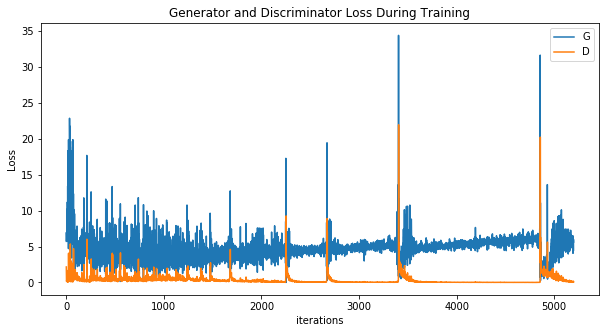

In [25]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

**Visualization of G’s progression**

Remember how we saved the generator’s output on the fixed_noise batch
after every epoch of training. Now, we can visualize the training
progression of G with an animation. Press the play button to start the
animation.




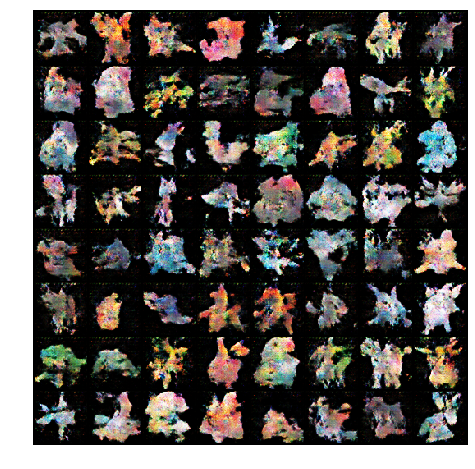

In [22]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

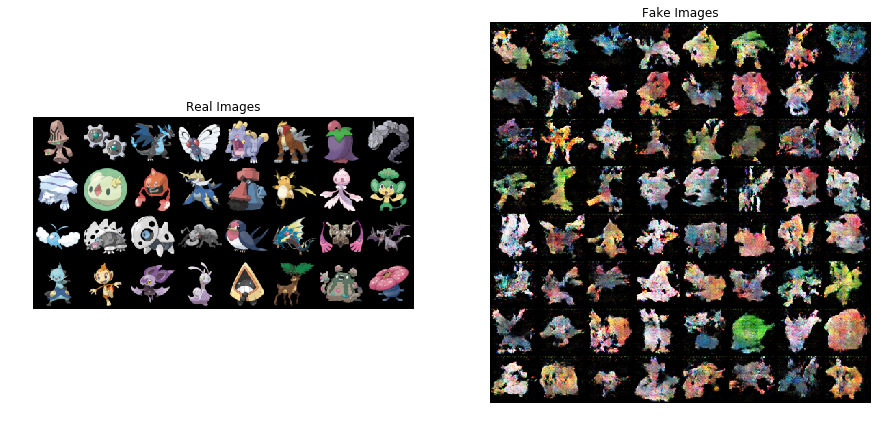

In [24]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [26]:
torch.save(netG.state_dict(), "./weight")